# Advanced Lane Lines

## Goals

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [5]:
# Imports
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

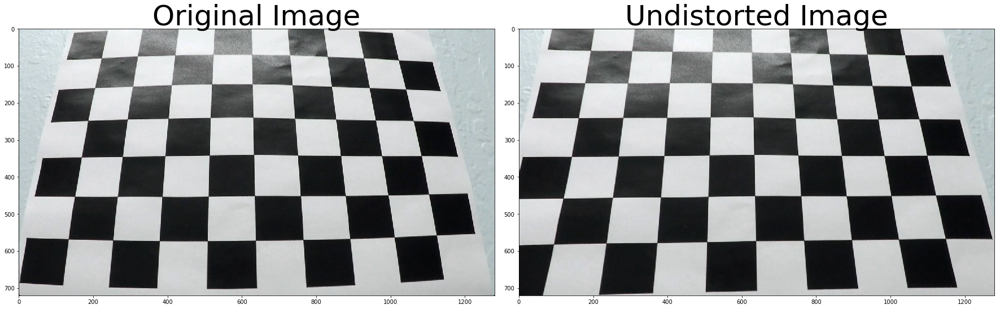

In [6]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
nx = 9
ny = 6
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
imgsize = ()

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    imgsize = gray.shape[::-1]

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

# Calibrate camera
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
        
# Pick an image and check the effect of calibration and undistortion
sample_img = cv2.imread(images[5])
undistorted_sample_img = cv2.undistort(sample_img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(sample_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted_sample_img)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

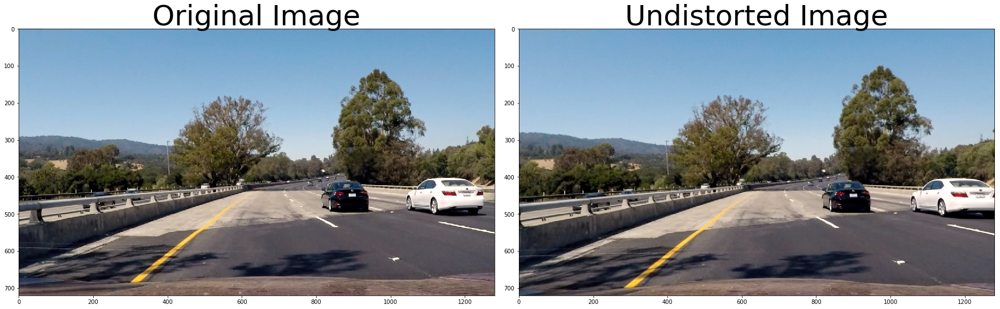

In [106]:
# Use straight_lines1 to prototype

# 1. Undistort image
test_img = mpimg.imread('test_images/test4.jpg')
undistorted_test_img = cv2.undistort(test_img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted_test_img)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [90]:
# Helper functions

# --- Applying color transform and thresholding ---
def abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    # Apply threshold
    dx = 1 if orient == 'x' else 0
    dy = 1 - dx
    
    sobel = cv2.Sobel(gray, cv2.CV_64F, dx, dy)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return grad_binary

def mag_thresh(gray, sobel_kernel=3, thresh=(0, 255)):
    # Calculate gradient magnitude
    # Apply threshold
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1)

    mag = np.sqrt(sobel_x**2 + sobel_y**2)
    scaled_sobel = np.uint8(255*mag/np.max(mag))
    
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    return mag_binary

def dir_thresh(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # Apply threshold
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    abs_sobel_x = np.abs(sobel_x)
    abs_sobel_y = np.abs(sobel_y)

    dirs = np.arctan2(abs_sobel_y, abs_sobel_x)
    
    dir_binary = np.zeros_like(dirs)
    dir_binary[(dirs >= thresh[0]) & (dirs <= thresh[1])] = 1
    return dir_binary

def hls_threshold(hls, s_thresh=(0, 255), h_thresh=(0, 255)):
    # 1) Convert to HLS color space
    # 2) Apply a threshold to the S channel
    # 3) Return a binary image of threshold result
    h_channel = hls[:,:,0]
    s_channel = hls[:,:,2]
    hls_binary = np.zeros_like(s_channel)
    hls_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1]) & (h_channel >= h_thresh[0]) & (h_channel <= h_thresh[1])] = 1
    return hls_binary

# --- Line Finding ---
def lane_hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    return histogram

def find_lane_pixels(binary_warped, is_debug=False):
    # Take a histogram of the bottom half of the image
    bottom_height = np.int(binary_warped.shape[0]//1.5)
    histogram = np.sum(binary_warped[bottom_height:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) if is_debug else None
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        if is_debug:
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),
                          (win_xleft_high,win_y_high),(0,255,0), 3) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),
                          (win_xright_high,win_y_high),(0,255,0), 3) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Colors in the left and right lane regions
    if is_debug:
        out_img[lefty, leftx] = [255, 0, 0]
        out_img[righty, rightx] = [0, 0, 255]

    return leftx, lefty, rightx, righty, out_img


# Change this function to fit_polynomial(binary_warped, left_line, right_line, is_debug=False)
# It will choose to use grid search or continue from previous according to whether left_line and right_line are fitted
# It will then set the new fits into left_line and right_line.
# It will then do sanity check steps and determine the current fit.
# It will only return out_img
def fit_polynomial(binary_warped, left_line, right_line, is_debug=False):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped, is_debug)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, out_img


def measure_curvature(y_eval, left_fit_cr, right_fit_cr, xm_per_pix, ym_per_pix):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
        
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    mean_curverad = np.mean([left_curverad, right_curverad])
    
    return left_curverad, right_curverad, mean_curverad

# --- Plotting ---
def plot_side_by_side(img_title_1, img_title_2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img_title_1[0])
    ax1.set_title(img_title_1[1], fontsize=50)
    ax2.imshow(img_title_2[0], cmap='gray')
    ax2.set_title(img_title_2[1], fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

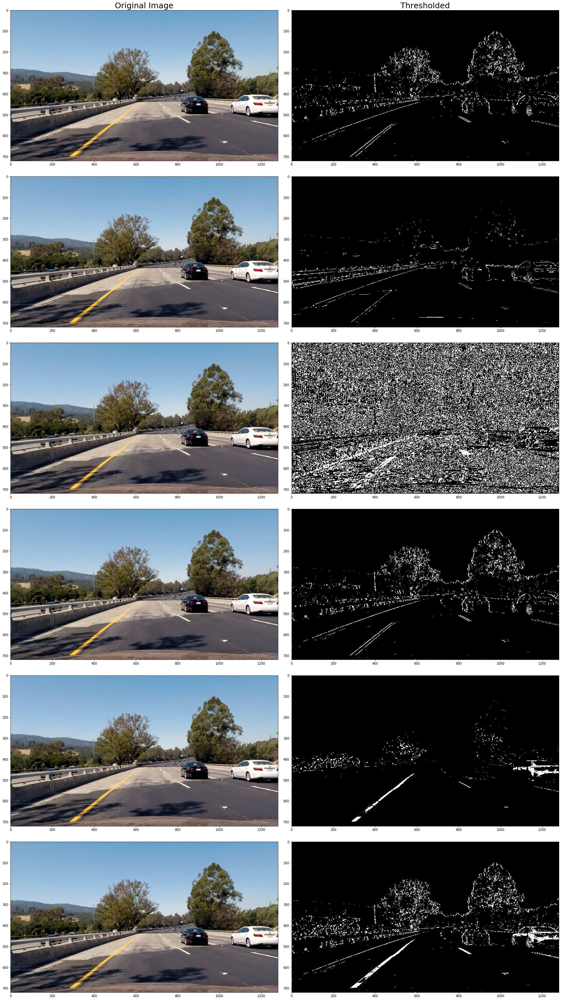

In [142]:
# HYPERPARAMETERS
# Choose a Sobel kernel size
ksize = 9 # Choose a larger odd number to smooth gradient measurements

def gradient_color_threshold(image, is_debug=False):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Apply Sobel filtering and thresholding
    gradx_binary = abs_sobel_thresh(gray, orient='x', sobel_kernel=ksize, thresh=(35, 100))
    
    # Apply Magnitude filtering
    mag_binary = mag_thresh(gray, sobel_kernel=ksize, thresh=(80, 130))
    
    # Apply Direction of Gradient filtering
    dir_binary = dir_thresh(gray, sobel_kernel=ksize, thresh=(0.7, 1.3))
    
    # Combine gradient filters
    gradient_combined = np.zeros_like(gray)
#     gradient_combined[(gradx_binary == 1) & (dir_binary == 1)] = 1
    gradient_combined[(gradx_binary == 1) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    # Color (HLS) threshold
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    hls_binary = hls_threshold(hls, s_thresh=(170, 255), h_thresh=(10,100))
    
    # Combine gradient and color filtering
    total_combined = np.zeros_like(gray)
    total_combined[(gradient_combined == 1) | (hls_binary == 1)] = 1

    if is_debug:
        f, axes = plt.subplots(6, 2, figsize=(24, 48))
        f.tight_layout()
        axes[0,0].imshow(image)
        axes[0,0].set_title('Original Image', fontsize=25)
        axes[0,1].imshow(gradx_binary, cmap='gray')
        axes[0,1].set_title('Thresholded', fontsize=25)
        axes[1,0].imshow(image)
        axes[1,1].imshow(mag_binary, cmap='gray')
        axes[2,0].imshow(image)
        axes[2,1].imshow(dir_binary, cmap='gray')
        axes[3,0].imshow(image)
        axes[3,1].imshow(gradient_combined, cmap='gray')
        axes[4,0].imshow(image)
        axes[4,1].imshow(hls_binary, cmap='gray')
        axes[5,0].imshow(image)
        axes[5,1].imshow(total_combined, cmap='gray')
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        
    return total_combined

total_combined = gradient_color_threshold(undistorted_test_img, is_debug=True)

## Perspective Transform

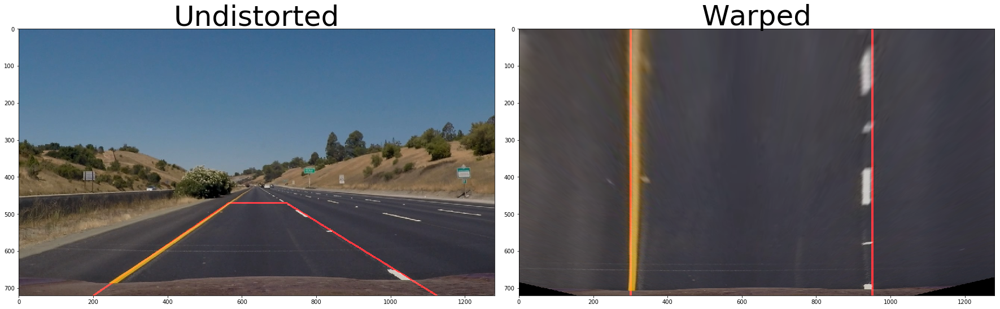

In [135]:
pers_img = mpimg.imread('test_images/straight_lines1.jpg')
img_size = pers_img.shape
(height, width) = img_size[:-1]

src = np.float32(
    [[200, height],
     [565, 470],
     [720, 470],
     [1125, height]])

dst = np.float32(
    [[300, height],
     [300, 210],
     [950, 210],
     [950, height]])

# Visualizing source (src) region
polygon = np.zeros_like(pers_img)
for i in range(src.shape[0]-1):
    p1 = tuple(src[i])
    p2 = tuple(src[i+1])
    cv2.line(polygon, p1, p2, (255, 0, 0), 4)
overlay = cv2.addWeighted(pers_img, 0.8, polygon, 1, 0.0)

M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)
pers_warped = cv2.warpPerspective(pers_img, M, (img_size[1],img_size[0]), flags=cv2.INTER_LINEAR)

# Visualizing dst region in warped imgage
par_lines = np.zeros_like(pers_warped)
cv2.line(par_lines, (300, height), (300, 0), (255, 0, 0), 4)
cv2.line(par_lines, (950, height), (950, 0), (255, 0, 0), 4)
overlay_warped = cv2.addWeighted(pers_warped, 0.8, par_lines, 1, 0.0)

plot_side_by_side([overlay, 'Undistorted'], [overlay_warped, 'Warped'])

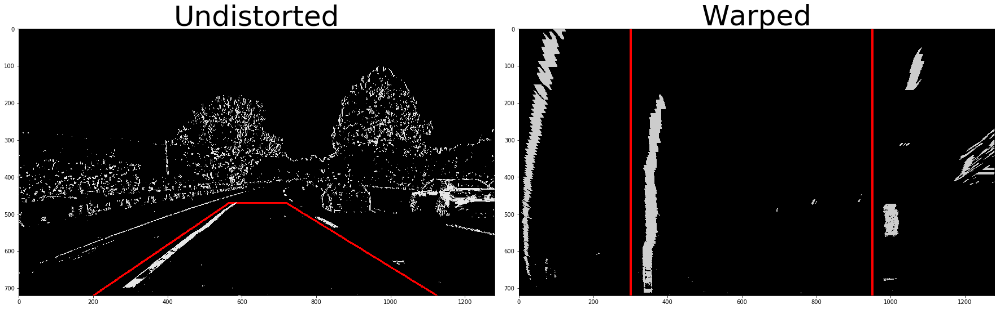

In [136]:
# Apply to thresholded binary image

stacked_combined = np.dstack((total_combined, total_combined, total_combined))*255
binary_overlay = cv2.addWeighted(stacked_combined, 0.9, polygon, 1.0, 0.0)

binary_warped = cv2.warpPerspective(total_combined, M, (img_size[1], img_size[0]), flags=cv2.INTER_LINEAR)

stacked_binary = np.dstack((binary_warped, binary_warped, binary_warped))*255
binary_overlay_warped = cv2.addWeighted(stacked_binary, 0.8, par_lines, 1, 0.0)
plot_side_by_side([binary_overlay, 'Undistorted'], [binary_overlay_warped, 'Warped'])

## Lane Line Detection

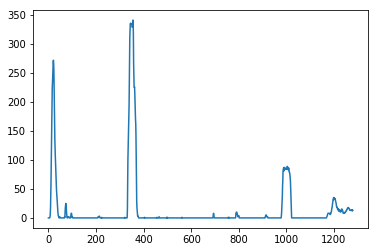

In [137]:
# Histogram peaks

histogram = lane_hist(binary_warped)
plt.plot(histogram)

In [138]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

In [11]:
import cv2
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

# Load our image - this should be a new frame since last time!
binary_warped = mpimg.imread('warped_example.jpg')

# Polynomial fit values from the previous frame
# Make sure to grab the actual values from the previous step in your project!
left_fit = np.array([ 2.13935315e-04, -3.77507980e-01,  4.76902175e+02])
right_fit = np.array([4.17622148e-04, -4.93848953e-01,  1.11806170e+03])

def fit_poly(img_shape, leftx, lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result

# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits
result = search_around_poly(binary_warped)

# View your output
plt.imshow(result)

FileNotFoundError: [Errno 2] No such file or directory: 'warped_example.jpg'

[  1.18851076e-04  -1.59369959e-01   4.01057144e+02]
[  2.65943943e-04  -3.30790179e-01   1.09982643e+03]
4354.04424033 2166.44496962


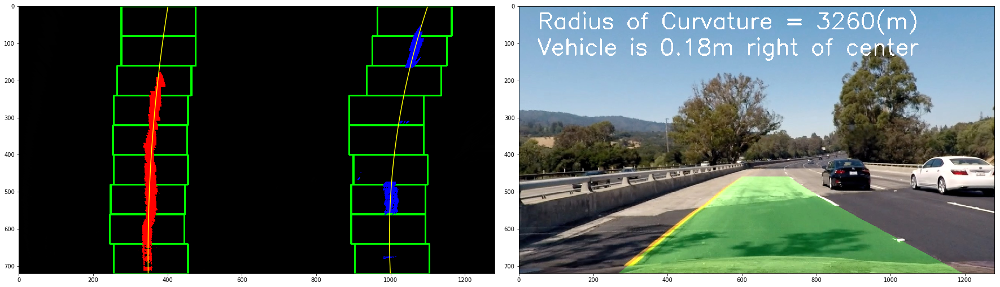

In [139]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

def lane_detection(image, binary_warped, left_line, right_line, is_debug = False):
    left_fit, right_fit, out_img = fit_polynomial(binary_warped, left_line, right_line, is_debug)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    print(left_fit)
    print(right_fit)
    
    # Unwarp and draw lane
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img_size[1], img_size[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    
    # Add text
    left_curverad, right_curverad, mean_curverad = measure_curvature(
        img_size[0], left_fit, right_fit, xm_per_pix, ym_per_pix)
    
    offset_pix = np.mean([left_fitx[-1], right_fitx[-1]]) - img_size[1]/2
    offset_m = offset_pix * xm_per_pix
    direction = 'left' if offset_m < 0 else 'right'
    direction_texts = [
        'Radius of Curvature = {:d}(m)'.format(np.int(mean_curverad)), 
        'Vehicle is {:.2f}m {} of center'.format(abs(offset_m), direction)]
    
    y0, dy = 60, 70
    for i, line in enumerate(direction_texts):
        y = y0 + i*dy
        cv2.putText(result, line, (50, y), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255), 3)
    
    if is_debug:
        f, axes = plt.subplots(1, 2, figsize=(24, 48))
        f.tight_layout()
        axes[0].imshow(out_img)
        axes[0].plot(left_fitx, ploty, color='yellow')
        axes[0].plot(right_fitx, ploty, color='yellow')
        axes[1].imshow(result)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    print(left_curverad, right_curverad)
    return result
    
final_result = lane_detection(undistorted_test_img, binary_warped, Line(), Line(), is_debug=True)

## Pipeline

[  2.54733025e-04  -3.11796818e-01   4.24694933e+02]
[  1.86784524e-04  -3.07361586e-01   1.09426743e+03]
2227.30714378 3036.66788381
[ -2.58653709e-04   3.58689969e-01   2.38601439e+02]
[ -2.42626003e-04   3.51855514e-01   8.65770553e+02]
2284.42934867 2422.28858124
[  1.58244070e-04  -3.48946126e-01   4.92138291e+02]
[  2.24687756e-04  -3.72626753e-01   1.11454069e+03]
3721.23975857 2669.45824872
[  1.18851076e-04  -1.59369959e-01   4.01057144e+02]
[  2.65943943e-04  -3.30790179e-01   1.09982643e+03]
4354.04424033 2166.44496962
[  2.64084198e-04  -3.67369498e-01   4.06725647e+02]
[  2.35586285e-04  -3.51321857e-01   1.09475769e+03]
2254.90092151 2494.41851846
[  1.46184622e-04  -3.49214072e-01   5.12446481e+02]
[  1.53265914e-04  -3.10870084e-01   1.13200503e+03]
4031.87508283 3717.62772694


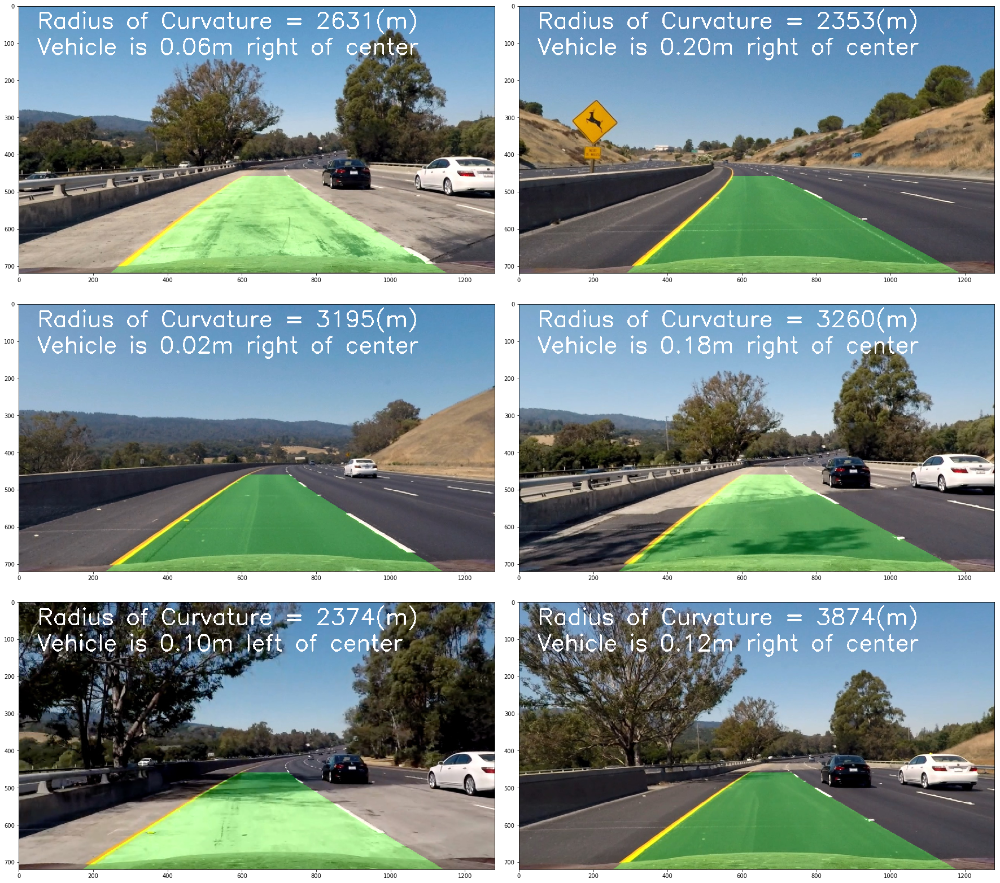

In [140]:
def process_image(image, left_line, right_line):
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    binary = gradient_color_threshold(undistorted)
    binary_warped = cv2.warpPerspective(binary, M, (img_size[1], img_size[0]), flags=cv2.INTER_LINEAR)
    return lane_detection(undistorted, binary_warped, left_line, right_line)

test_images = sorted(glob.glob('test_images/test*.jpg'))

f, axes = plt.subplots(len(test_images)//2, 2, figsize=(24, 24))
f.tight_layout()
for i in range(len(test_images)):
    fname = test_images[i]
    processed = process_image(mpimg.imread(fname), Line(), Line())
    plt.imsave('output_images/' + fname.split('/')[1], processed)
    axes[i//2][i%2].imshow(processed)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Video

In [11]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [19]:
from functools import partial

output_path = 'output_videos/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
clip1 = VideoFileClip("project_video.mp4").subclip(0,2)
# clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
left_line = Line()
right_line = Line()
process_with_lines = partial(process_image, left_line=left_line, right_line=right_line)

output_video = clip1.fl_image(process_with_lines)
%time output_video.write_videofile(output_path, audio=False)

[MoviePy] >>>> Building video output_videos/project_video.mp4
[MoviePy] Writing video output_videos/project_video.mp4


 98%|█████████▊| 50/51 [00:17<00:00,  2.52it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video.mp4 

CPU times: user 14.4 s, sys: 738 ms, total: 15.1 s
Wall time: 20.1 s


In [20]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_path))